In [60]:
import xgboost as xgb
import plotly.offline as py
import plotly.graph_objs as go
import pandas as pd
import numpy as np
py.init_notebook_mode(connected=True)

In [61]:
data_origin = pd.read_csv('data_to_learn.soap.3.csv')

In [62]:
data_origin = data_origin[data_origin.nGB != 28]

In [75]:
data_origin

,nGB,nRandom,BindingEnergy,id,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,1,0.001107,57648,14.685570,-41.385712,166.761002,116.629936,-469.952667,1893.643433,...,9.641212e-01,3.037343e+00,-6.598746e+00,1.433724e+01,1.752469e-03,-1.645578e-02,5.922527e-02,1.545223e-01,-0.556101,2.002660
1,1,2,0.003313,51853,22.505638,-68.887444,234.304245,210.857376,-717.181213,2439.321289,...,8.403283e-08,5.357461e-07,-6.465431e-07,8.518265e-07,9.968915e-09,-9.225154e-08,2.911380e-07,8.562021e-07,-0.000003,0.000009
2,1,3,0.000967,60668,22.506212,-68.888222,234.397324,210.856766,-717.455933,2441.197510,...,1.151725e-05,3.470630e-05,-4.183858e-05,3.524230e-04,9.233560e-07,-8.644200e-06,1.052087e-05,8.133423e-05,-0.000093,0.000254
3,1,4,-0.008195,10034,7.260226,-14.472467,77.499916,28.849283,-154.487610,827.279602,...,2.155773e-01,5.221881e-01,-1.523965e+00,4.463497e+00,1.169548e-02,-1.058007e-01,2.648151e-01,9.575711e-01,-2.387546,6.791561
4,1,5,0.005728,21910,22.503370,-68.879807,234.292023,210.831894,-717.136597,2439.312744,...,2.880204e-07,5.496963e-07,-1.482438e-06,8.985789e-06,6.294713e-09,-5.778712e-08,1.349876e-07,5.333366e-07,-0.000001,0.000003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26995,27,996,-0.000262,94831,22.393095,-68.572449,233.524841,209.983490,-715.103027,2435.297607,...,3.065704e-04,2.269946e-03,-2.057927e-03,4.265397e-03,2.304877e-05,-2.023737e-04,3.135218e-04,1.782233e-03,-0.002637,0.007868
26996,27,997,0.000748,87902,16.438160,-47.333206,181.403122,136.294586,-522.345032,2001.872070,...,8.594545e-01,2.767349e+00,-5.881764e+00,1.264870e+01,5.945144e-03,-5.458416e-02,1.402084e-01,5.012330e-01,-1.291208,3.501914
26997,27,998,0.002400,34201,22.513424,-68.918755,234.376846,210.976089,-717.481262,2439.989014,...,3.714762e-05,1.639264e-04,-2.552480e-04,4.425977e-04,3.042984e-06,-2.840496e-05,2.849314e-05,2.651690e-04,-0.000267,0.000299
26998,27,999,0.144771,62641,22.086557,-67.431648,228.267197,205.873077,-696.914185,2359.168701,...,-4.355696e-03,6.580793e-03,6.040445e-02,6.950685e-01,1.273707e-04,-1.415307e-03,-5.437166e-03,1.573908e-02,0.059533,0.372420


## Preprocession

In [63]:
#random shuffle
data = data_origin.sample(frac=1, random_state=1)
#split data
Y_all = data['BindingEnergy'].to_numpy()
Y_train = Y_all[0:int(len(data)*.7)]
Y_temp = Y_all[int(len(data)*.7):]
Y_cos = Y_temp[:int(len(Y_temp)*.5)]
Y_test = Y_temp[int(len(Y_temp)*.5):]

X_all = data.iloc[:, 4:].to_numpy()
X_train = X_all[:int(len(X_all)*.7)]

#normalization
X_mean = np.mean(X_train, axis = 0)
X_std = np.std(X_train, axis = 0)

X_train = (X_train - X_mean) / X_std

X_temp = X_all[int(len(X_all)*.7):]
X_temp = (X_temp - X_mean) / X_std
X_cos = X_temp[:int(len(X_temp)*.5)]
X_test = X_temp[int(len(X_temp)*.5):]   

## Gradient Boosting

In [64]:
dtrain = xgb.DMatrix(X_train, Y_train)
dcos = xgb.DMatrix(X_cos, Y_cos)
dtest = xgb.DMatrix(X_test, Y_test)
param = {'verbosity':1, 'booster':'gbtree','eta': 0.3, 'max_depth': 25, 'subsample': 0.5, 'lambda':2,'alpha':1}

In [65]:
watchlist = [(dtest, 'eval'),(dtrain, 'train')]
num_round = 80
model = xgb.train(param, dtrain, num_round, watchlist)

[0]	eval-rmse:0.356737	train-rmse:0.35642
[1]	eval-rmse:0.270367	train-rmse:0.268664
[2]	eval-rmse:0.212742	train-rmse:0.207796
[3]	eval-rmse:0.175066	train-rmse:0.165889
[4]	eval-rmse:0.151513	train-rmse:0.137688
[5]	eval-rmse:0.136805	train-rmse:0.119
[6]	eval-rmse:0.127115	train-rmse:0.105511
[7]	eval-rmse:0.120229	train-rmse:0.096234
[8]	eval-rmse:0.116162	train-rmse:0.088497
[9]	eval-rmse:0.11275	train-rmse:0.08256
[10]	eval-rmse:0.111001	train-rmse:0.077859
[11]	eval-rmse:0.108732	train-rmse:0.073462
[12]	eval-rmse:0.107684	train-rmse:0.070447
[13]	eval-rmse:0.106686	train-rmse:0.067653
[14]	eval-rmse:0.105971	train-rmse:0.064821
[15]	eval-rmse:0.105135	train-rmse:0.062498
[16]	eval-rmse:0.104416	train-rmse:0.060428
[17]	eval-rmse:0.103358	train-rmse:0.058741
[18]	eval-rmse:0.103267	train-rmse:0.057174
[19]	eval-rmse:0.102852	train-rmse:0.055584
[20]	eval-rmse:0.102386	train-rmse:0.053973
[21]	eval-rmse:0.102021	train-rmse:0.052372
[22]	eval-rmse:0.101987	train-rmse:0.051298
[23]

## Training

In [66]:
Y_mean = np.mean(Y_train)
SS_tot = np.sum(np.power(Y_train - Y_mean, 2))
SS_res = np.power(np.linalg.norm(model.predict(dtrain) - dtrain.get_label()), 2)
R_squared = 1-SS_res/SS_tot
R_squared = 1-(1-R_squared)*(X_train.shape[0]-1)/(X_train.shape[0]-1-X_train.shape[1])

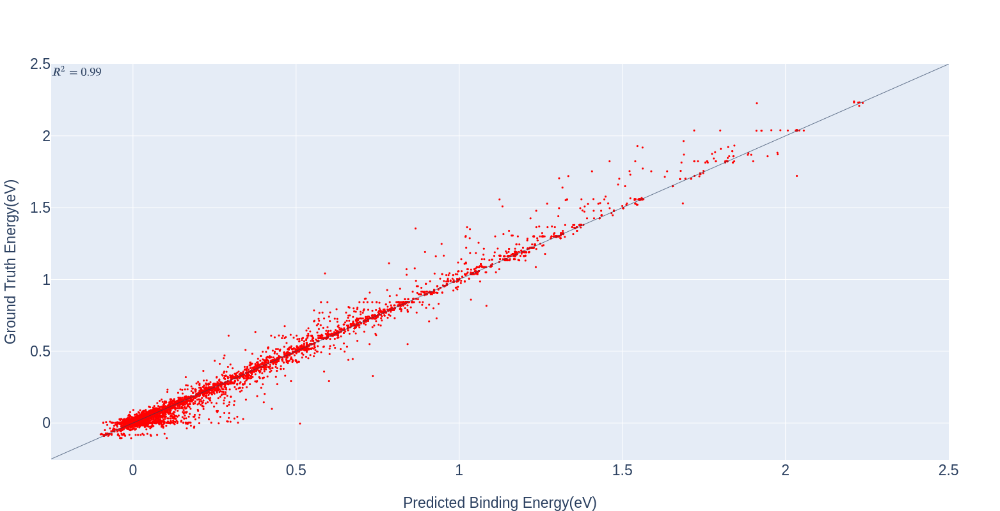

In [67]:
#draw correlation training set
main = go.Scatter(x = model.predict(dtrain), 
          y = dtrain.get_label(), 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 23)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':2.5,
                            'y0':-0.25,
                            'y1':2.5,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

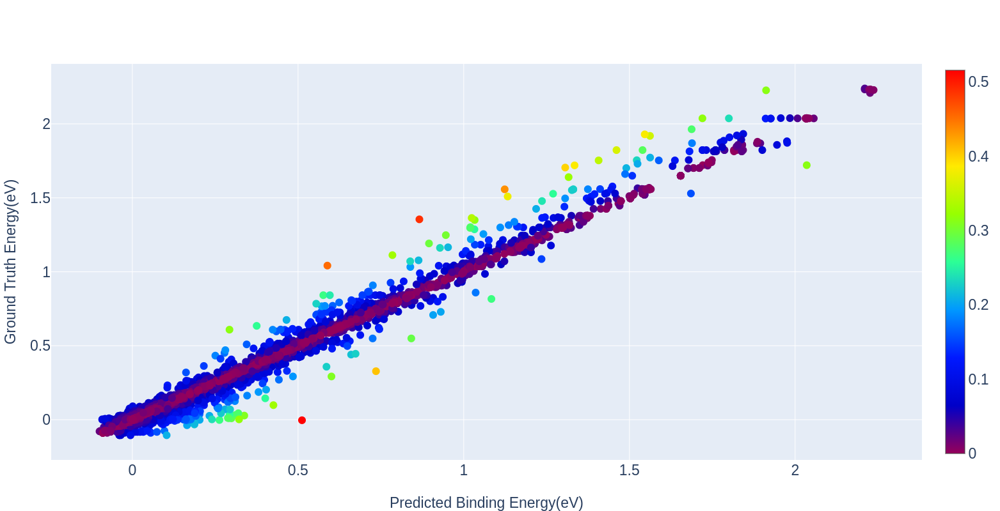

In [68]:
main = go.Scatter(x = model.predict(dtrain) , 
                y = dtrain.get_label(),
                text = np.around(abs(model.predict(dtrain) - dtrain.get_label()),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(model.predict(dtrain) - dtrain.get_label()), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)}
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)

## Cross Validation

In [69]:
Y_mean = np.mean(Y_cos)
SS_tot = np.sum(np.power(Y_cos - Y_mean, 2))
SS_res = np.power(np.linalg.norm(model.predict(dcos) - dcos.get_label()), 2)
R_squared = 1-SS_res/SS_tot
R_squared = 1-(1-R_squared)*(X_train.shape[0]-1)/(X_train.shape[0]-1-X_train.shape[1])

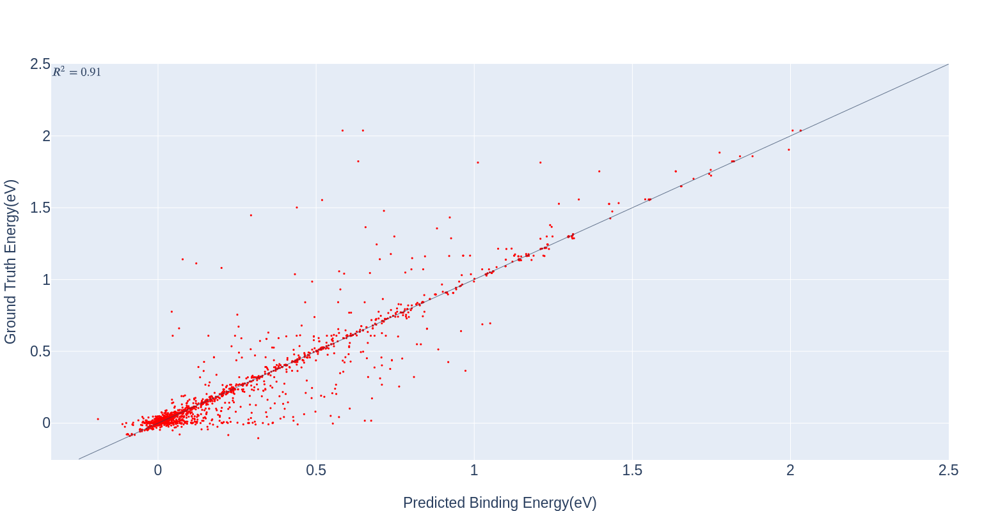

In [70]:
#draw correlation cross validation set
main = go.Scatter(x = model.predict(dcos), 
          y = dcos.get_label(), 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 23)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':2.5,
                            'y0':-0.25,
                            'y1':2.5,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

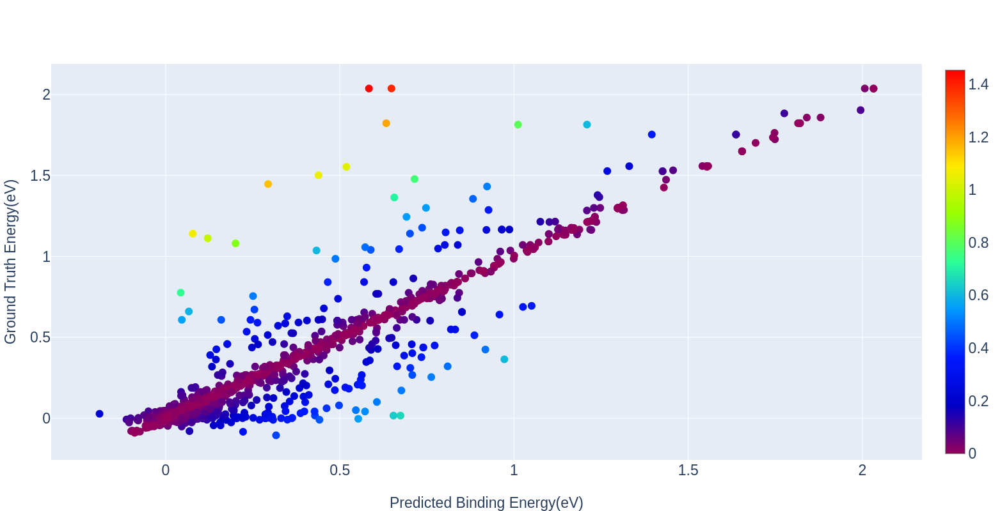

In [71]:
main = go.Scatter(x = model.predict(dcos) , 
                y = dcos.get_label(),
                text = np.around(abs(model.predict(dcos) - dcos.get_label()),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(model.predict(dcos) - dcos.get_label()), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)}
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)

## Test

In [72]:
Y_mean = np.mean(Y_test)
SS_tot = np.sum(np.power(Y_test - Y_mean, 2))
SS_res = np.power(np.linalg.norm(model.predict(dtest) - dtest.get_label()), 2)
R_squared = 1-SS_res/SS_tot
R_squared = 1-(1-R_squared)*(X_train.shape[0]-1)/(X_train.shape[0]-1-X_train.shape[1])

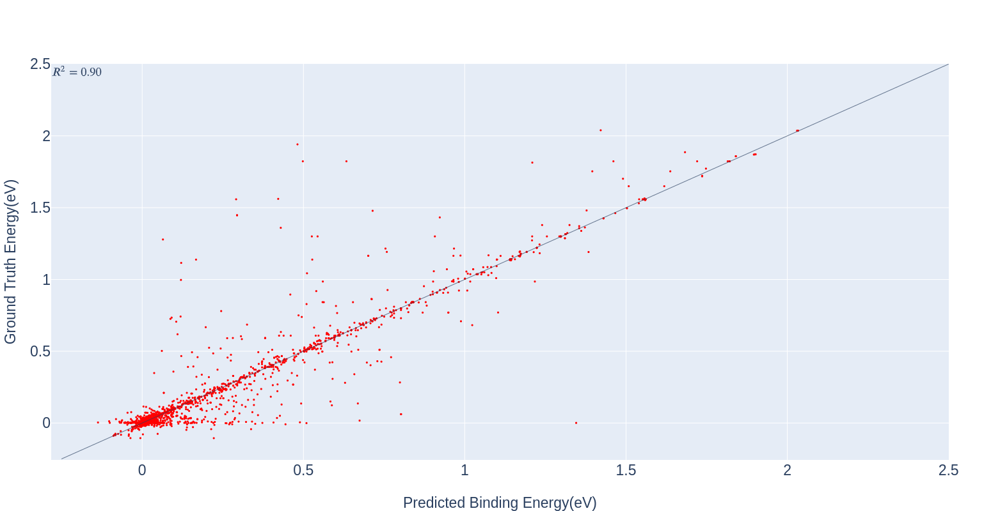

In [73]:
#draw correlation
main = go.Scatter(x = model.predict(dtest), 
          y = dtest.get_label(), 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 23)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':2.5,
                            'y0':-0.25,
                            'y1':2.5,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

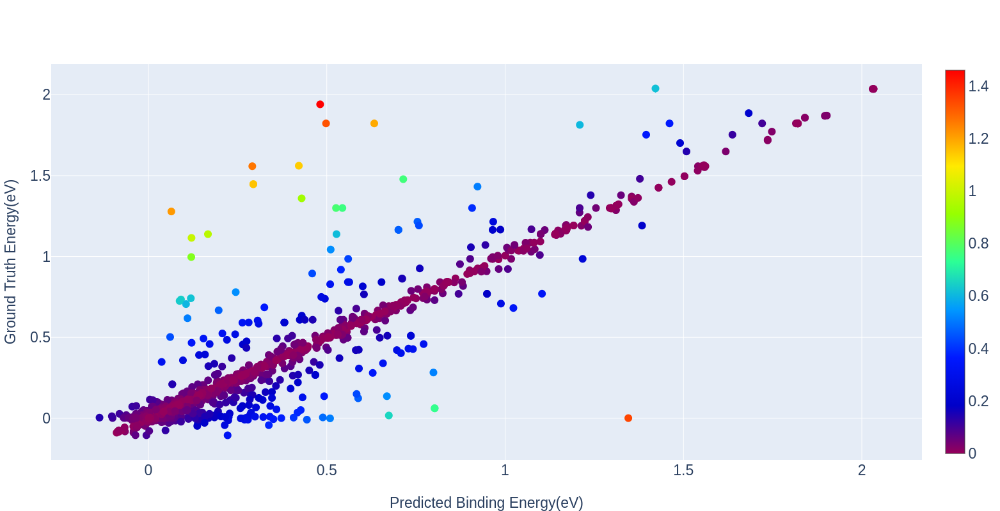

In [74]:
main = go.Scatter(x = model.predict(dtest) , 
                y = dtest.get_label(),
                text = np.around(abs(model.predict(dtest) - dtest.get_label()),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(model.predict(dtest) - dtest.get_label()), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)}
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)